# Torrens University
**ISY503 - Intelligent Systems**

**Assessment 3, Vision Project - Self driving car**

**Lecturer: Aaron Bere**

* Group 1 - Members:
    * Daniela Alejandra Renz, A0005295
    * Diana Paola Baquero Almanza, A00062732
    * Kevalkumar hiteshkumar patel, A00080494
    * Camilo Andres Bogota Ospina, A00053712
    
December/2022


**References**

* The computer vision - Self driving car project was developed by following the instructions from [A Complete Guide to Self Driving Car](https://www.codeproject.com/Articles/1273179/A-Complete-guide-to-self-driving-Car). All the data required for the project was created as per required using the Udacity Self Driving Car simulator.

* Instructions of how to create the Unity interface for the Simulator can be found in [Introduction to Udacity Self-Driving Car Simulator](https://naokishibuya.medium.com/introduction-to-udacity-self-driving-car-simulator-4d78198d301d).

# Implementation for Track 1 (left side)
**Training the model**

**Dependicies to use**

* Os: Provides functions for interacting with the operating system.
* Numpy: 	Linear algebraic modelling
* Pandas: SQL data manipulation
* Matplotlib: Visualisation
* Keras: 	Deep learning
* Imgaug: Image processing
* Cv2:	Image transformation
* Tensorflow:	Machine Learning / AI
* Sklearn:	Modeling / Predictive data
* Ntpath: Provides os. path functionality on Windows platforms
* Random: Generate random numbers


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras

from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import tensorflow as tf
import ntpath
import random

**Data Formating and Cleaning**

After generating the data from the Manual driving by using the simulator, all the images and the Driving Log that contains aditional data related to steering angle, throttle, brake and speed are imported. The data then is formated

In [2]:
# Directory where the images and Driving log is located
datadir = 'Sim\CABO-1Track'

# Features are added to the SQL data
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)

# SQL Display setup
pd.set_option('display.max_colwidth', -1)

# Shows the first 5 rows of the Data after the feature names
data.head()

C:\Users\camil\AppData\Local\Temp\ipykernel_14996\306690210.py:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\center_2022_12_01_16_25_14_727.jpg,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\left_2022_12_01_16_25_14_727.jpg,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\right_2022_12_01_16_25_14_727.jpg,0.0,0.0,0.0,4.536877e-06
1,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\center_2022_12_01_16_25_14_792.jpg,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\left_2022_12_01_16_25_14_792.jpg,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\right_2022_12_01_16_25_14_792.jpg,0.0,0.0,0.0,2.168591e-06
2,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\center_2022_12_01_16_25_14_865.jpg,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\left_2022_12_01_16_25_14_865.jpg,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\right_2022_12_01_16_25_14_865.jpg,0.0,0.0,0.0,4.757327e-07
3,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\center_2022_12_01_16_25_14_940.jpg,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\left_2022_12_01_16_25_14_940.jpg,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\right_2022_12_01_16_25_14_940.jpg,0.0,0.0,0.0,3.802474e-06
4,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\center_2022_12_01_16_25_15_020.jpg,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\left_2022_12_01_16_25_15_020.jpg,C:\Users\camil\Car\ISY503\Sim\CABO-1Track\IMG\right_2022_12_01_16_25_15_020.jpg,0.0,0.0,0.0,8.628402e-07


Cleaning the data

In [3]:
# Removing the path from the location of each image
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)

# Displays the first 5 rows of SQL data
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2022_12_01_16_25_14_727.jpg,left_2022_12_01_16_25_14_727.jpg,right_2022_12_01_16_25_14_727.jpg,0.0,0.0,0.0,4.536877e-06
1,center_2022_12_01_16_25_14_792.jpg,left_2022_12_01_16_25_14_792.jpg,right_2022_12_01_16_25_14_792.jpg,0.0,0.0,0.0,2.168591e-06
2,center_2022_12_01_16_25_14_865.jpg,left_2022_12_01_16_25_14_865.jpg,right_2022_12_01_16_25_14_865.jpg,0.0,0.0,0.0,4.757327e-07
3,center_2022_12_01_16_25_14_940.jpg,left_2022_12_01_16_25_14_940.jpg,right_2022_12_01_16_25_14_940.jpg,0.0,0.0,0.0,3.802474e-06
4,center_2022_12_01_16_25_15_020.jpg,left_2022_12_01_16_25_15_020.jpg,right_2022_12_01_16_25_15_020.jpg,0.0,0.0,0.0,8.628402e-07


**Data Distribution Analysis**

Determines the distribution of data, remove inconsistent data to increase performance of the model

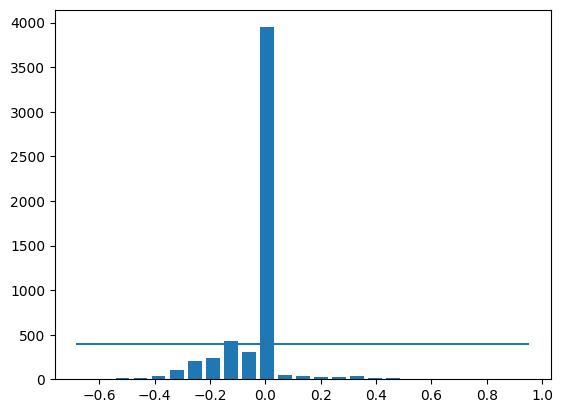

In [4]:
# Bins are used to discretise data, determining where the most data is grouped
num_bins = 25
# Samples to determine a limit to cutoff the entire data
samples_per_bin = 400
# Histograms are used to graphic representation of the data statistics
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), \
(samples_per_bin, samples_per_bin))

total data: 5538
removed: 3581
remaining: 1957


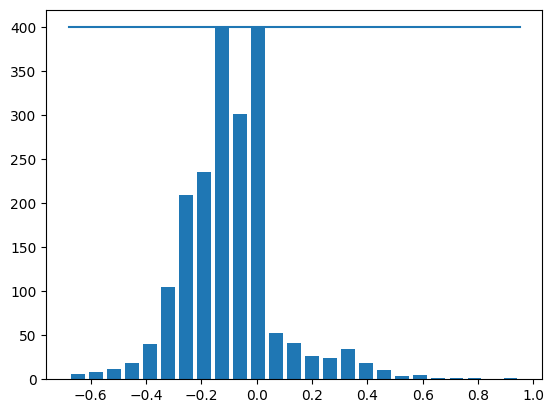

In [5]:
# Removes the data that is out of range
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

# Formating graphics to present results
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))
 
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), \
(samples_per_bin, samples_per_bin))

**Data array for preprocessing**

Filtered data es then grouped into a new array for further processing

In [6]:
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings
 
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2022_12_01_16_25_15_507.jpg
left        left_2022_12_01_16_25_15_507.jpg  
right       right_2022_12_01_16_25_15_507.jpg 
steering   -0.1                               
throttle    0.425974                          
reverse     0.0                               
speed       0.413014                          
Name: 11, dtype: object


**Model training and Validation**

A random dataset is trained and validated using histograms to determine model performance

In [7]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, \
test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 4696
Valid Samples: 1175


Text(0.5, 1.0, 'Validation set')

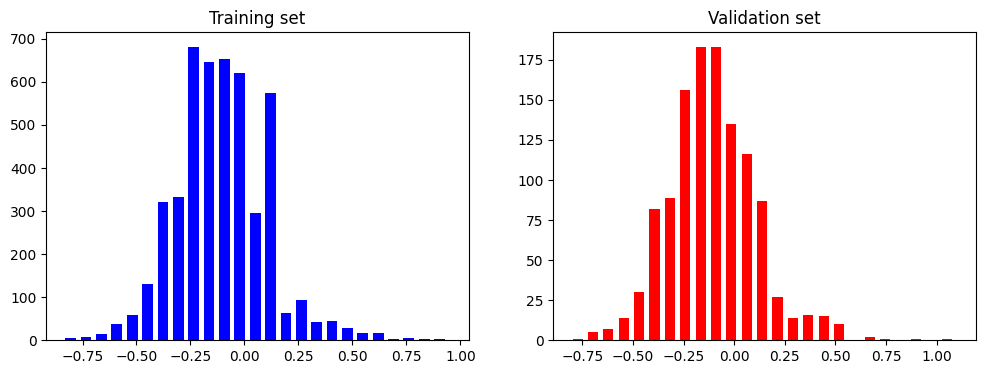

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

**Image Processing**

Different functions are applied for image processing towards normalisation of the data. It increasese the diversity of training while applying random transformations such as zoom, pan, brightness and mirroring.

Keras augmentation is used to increase the diversity of training, by augmentating perturbances such as dust, rain (in the real model).

The image is separated in colors and Gaussian Blur filter is applied to make the image smooth and remove the noises. In the end the resulted image ready to be processed into the Convolutional Neural Network (CNN) to bring the steering angle.

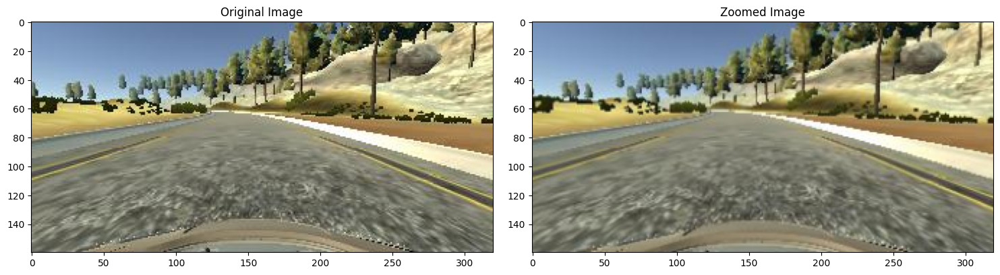

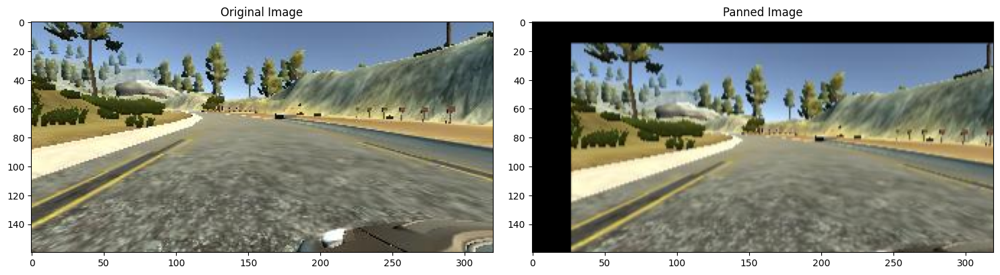

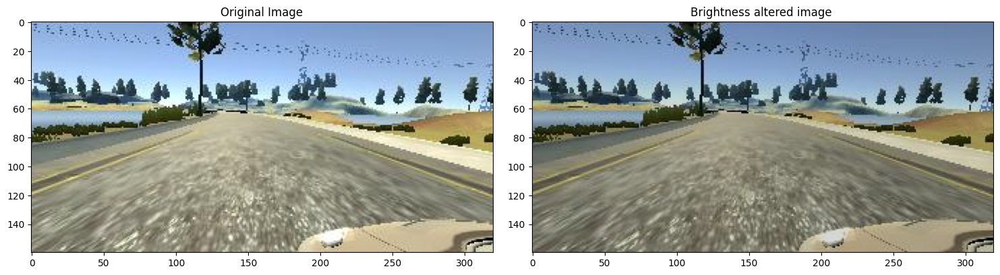

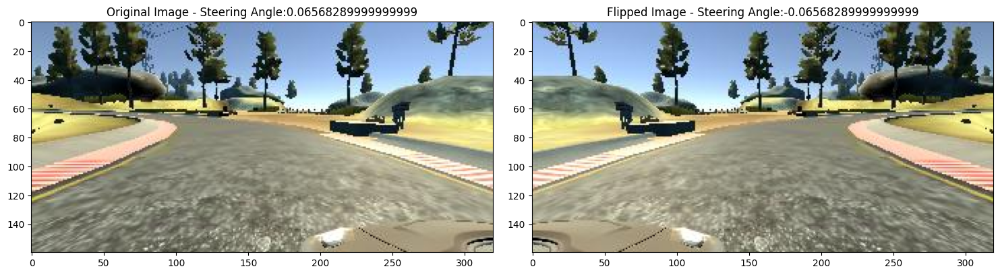

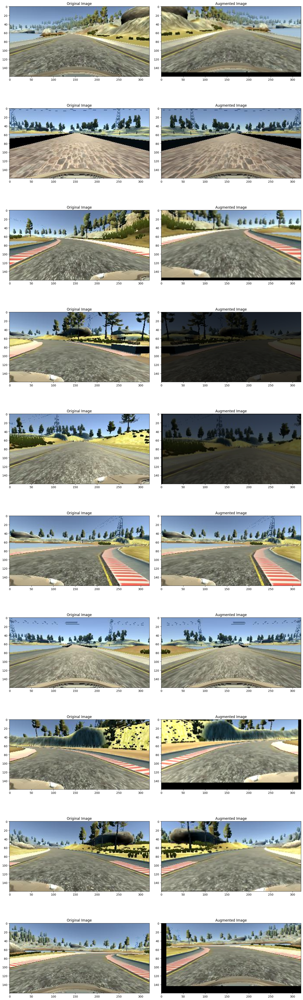

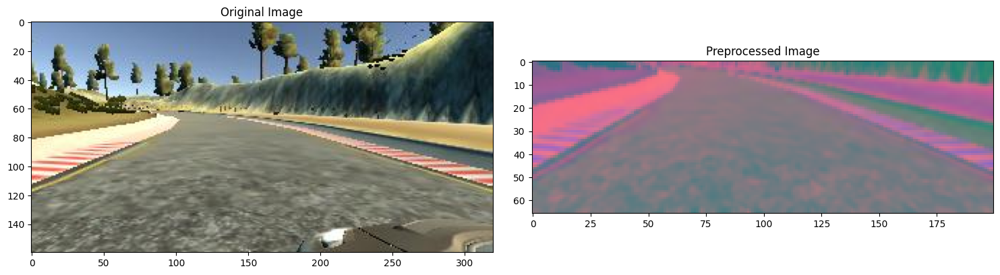

In [9]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
 
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    
    return image, steering_angle
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")
 
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
     
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

**CNN nvidia Model**

THis model uses 9-layer CNN to establish a representation of its environment and respond accurate. 

1 layer isused to perform image normalisation. 3 layers to perform feature extraction. And the las 5 layers are linked with 3 fully connected layers to control the steering angle of the car. Elu function is used to recover and fix errors after proccessing the model.

Adam optimizer is used for back propagation and recalculate weights from deep learning

In [10]:
def nvidia_model():
  model = Sequential()
  model.add(Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Convolution2D(64, (3, 3), activation='elu'))
  model.add(Convolution2D(64, (3, 3), activation='elu'))
  model.add(Flatten())
  model.add(Convolution2D(64, (3, 3), activation='elu'))

In [11]:
# Original
def nvidia_model():
  model = Sequential()
  model.add(Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Convolution2D(64, (3, 3), activation='elu'))
  
  model.add(Convolution2D(64, (3, 3), activation='elu'))
#   model.add(Dropout(0.5))  
  
  model.add(Flatten())
  
  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))
  
  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))
  
  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))
 
  model.add(Dense(1))
  
  optimizer = Adam(lr=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model





**Training process**

The dataset is trained. 10 epochs are used as the number of backpropagation iterations. The more epochs the better results, the more time required for training the model.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

C:\Users\camil\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)
C:\Users\camil\AppData\Local\Temp\ipykernel_14996\1878079328.py:5: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


None
Epoch 1/10
300/300 [==============================] - 408s 1s/step - loss: 0.0678 - val_loss: 0.0322
Epoch 2/10
300/300 [==============================] - 394s 1s/step - loss: 0.0394 - val_loss: 0.0286
Epoch 3/10
300/300 [==============================] - 380s 1s/step - loss: 0.0333 - val_loss: 0.0267
Epoch 4/10
300/300 [==============================] - 379s 1s/step - loss: 0.0286 - val_loss: 0.0236
Epoch 5/10
300/300 [==============================] - 291s 972ms/step - loss: 0.0264 - val_loss: 0.0223
Epoch 6/10
300/300 [==============================] - 294s 983ms/step - loss: 0.0246 - val_loss: 0.0215
Epoch 7/10
300/300 [==============================] - 391s 1s/step - loss: 0.0230 - val_loss: 0.0191
Epoch 8/10
300/300 [==============================] - 397s 1s/step - loss: 0.0226 - val_loss: 0.0204
Epoch 9/10
300/300 [==============================] - 320s 1s/step - loss: 0.0219 - val_loss: 0.0206
Epoch 10/10
300/300 [==============================] - 316s 1s/step - loss: 0.02

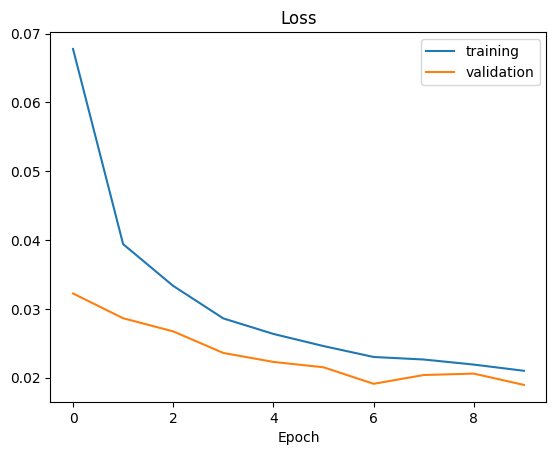

In [12]:
#def nvidia_model():
model = nvidia_model()

print(model.summary())
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1), 
                                steps_per_epoch=300, 
                                epochs=10,
                                validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                validation_steps=200,
                                verbose=1,
                                shuffle = 1)
  
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')




**Saving the model**

The model is then saved locally as a .h5 file.

In [13]:
model.save('modelT1v2.h5')